In [1]:
%reload_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import geopandas as gpd


pd.options.display.max_columns = 999
pd.options.display.max_rows = 999
pd.options.display.max_colwidth = 100


import matplotlib.pyplot as plt
import matplotlib.font_manager as font_manager
from matplotlib import rc


import plotly.express as px

from paths import *
from scripts import vis_simulaCovid

import yaml


## SimulaCovid API ('http://datasource.coronacidades.org:7000/')
- br/states/rt
- br/cities/embaixadores
- br/cities/cnes
- world/owid/heatmap
- br/cities/farolcovid/main
- br/cities/rt
- br/cities/simulacovid/main
- br/cities/cases/full
- br/states/farolcovid/main


### RT

In [2]:
#load br cities
geo_sp = gpd.read_file('../../brasil_geodata/maps/sp_municipios.json')
# cols = ['geocodigo','nome_mesorregiao','geometry']
cols = ['geocodigo','nome_mesorregiao','nome_municipio']
geo_sp = geo_sp[cols]

In [3]:
#load state data
url  = 'http://datasource.coronacidades.org/'
data = 'br/states/rt'

ds = pd.read_csv(f'{url}{data}')

ds['last_updated'] = pd.to_datetime(ds['last_updated'])

sp = ds[ds['state']=='SP']
sp = sp.rename(columns={'state':'city_id'})
sp['nome_mesorregiao'] = 'SP'
sp['nome_municipio']   = 'Estado de SP'

rj = ds[ds['state']=='RJ']
rj = rj.rename(columns={'state':'city_id'})
rj['nome_mesorregiao'] = 'RJ'
rj['nome_municipio']   = 'Estado do RJ'

mg = ds[ds['state']=='MG']
mg = mg.rename(columns={'state':'city_id'})
mg['nome_mesorregiao'] = 'MG'
mg['nome_municipio']   = 'Estado de MG'

am = ds[ds['state']=='AM']
am = am.rename(columns={'state':'city_id'})
am['nome_mesorregiao'] = 'AM'
am['nome_municipio']   = 'Estado de AM'

In [4]:
#load cities data
data = 'br/cities/rt'

df = pd.read_csv(f'{url}{data}')

df['last_updated'] = pd.to_datetime(df['last_updated'])


In [5]:

dd = df.merge(geo_sp, how='right', left_on = 'city_id', right_on = 'geocodigo')
dd.head()

regiao = 'Vale do Paraíba Paulista'
mask = (dd['nome_mesorregiao']==regiao)
vale = dd[mask]
vale = vale[vale['city_id'].notnull()]

mask = (dd['nome_municipio']=='São Paulo')
sp_city = dd[mask]


vale = pd.concat([vale,sp_city], 0)
vale = pd.concat([vale,sp], 0)
vale = pd.concat([vale,rj], 0)
# vale = pd.concat([vale,mg], 0)
# vale = pd.concat([vale,am], 0)

In [6]:
def plot_rt_final(df_final,col,N_COLS):
    
    N_ROWS = int(np.ceil(len(df_final[col].unique()) / N_COLS))

    # opening figura
    fig, axes = plt.subplots(nrows=N_ROWS, ncols=N_COLS, figsize=(15, N_ROWS*3), dpi=400)

    for i, (city, result) in enumerate(df_final.groupby(col,sort=False)):
        ax = axes.flat[i]
        vis_simulaCovid.plot_rt(result, ax, city)
    fig.tight_layout()
    fig.set_facecolor('w')
    
    return fig

In [7]:
len(vale['nome_municipio'].unique())

36

In [8]:
vale.sort_values(by='last_updated', ascending=False).head()

,city_id,last_updated,Rt_most_likely,Rt_low_95,Rt_high_95,data_last_refreshed,geocodigo,nome_mesorregiao,nome_municipio
1629,RJ,2020-06-28,0.95,0.91,0.97,2020-06-29 12:10:04,NaN,RJ,Estado do RJ
13529,3.52491e+06,2020-06-28,1.18,0.73,1.62,2020-06-29 07:10:10,3524907.0,Vale do Paraíba Paulista,Jambeiro
18452,3.53561e+06,2020-06-28,1.11,0.64,1.52,2020-06-29 07:10:10,3535606.0,Vale do Paraíba Paulista,Paraibuna
7180,3.5136e+06,2020-06-28,1.22,0.55,1.94,2020-06-29 07:10:10,3513603.0,Vale do Paraíba Paulista,Cunha
23909,3.5482e+06,2020-06-28,3.20,1.97,4.38,2020-06-29 07:10:10,3548203.0,Vale do Paraíba Paulista,Santo Antônio do Pinhal


In [9]:
fig = plot_rt_final(ds,'state',3)
fig.savefig("/home/m/Downloads/Evolucao da Taxa de Transmissão Efetiva - Estados.pdf.pdf", bbox_inches='tight')

In [10]:
last_date = max(vale['last_updated']).strftime('%d-%m-%Y')

fig = plot_rt_final(vale,'nome_municipio',4)

fig.savefig(f"/home/m/Downloads/Evolucao da Taxa de Transmissão Efetiva - Vale do Paraíba e Litoral Norte.pdf", bbox_inches='tight')

## Selected cities

In [11]:
## Rt for most recent date
max_date = max(vale['last_updated'])
vale_last_date = vale.drop_duplicates('nome_municipio', keep='last').sort_values(by='Rt_most_likely')
last_date = max_date.strftime('%Y-%m-%d')
fig = vis_simulaCovid.plot_rt_bars(vale_last_date, title= f'Taxa Transmissão Efetiva em {last_date}', place_type='nome_municipio')

In [12]:
fig = fig.update_xaxes(tickangle=30)
fig.write_image(f"/home/m/Downloads/Taxa Transmissão Efetiva em {last_date}.pdf", width=1080, height=720)

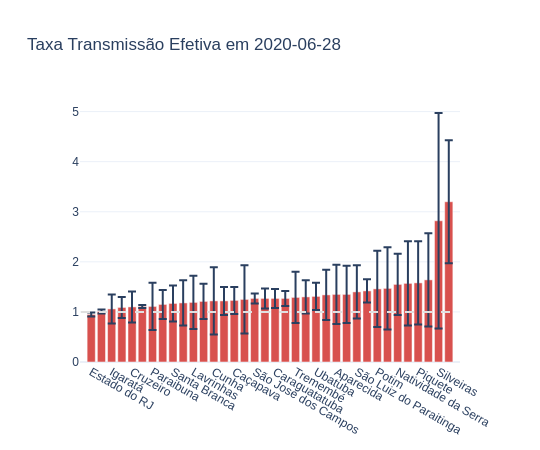

In [13]:
fig

In [14]:
vale_last_date['nome_municipio']

1629                Estado do RJ
25213                  São Paulo
10646                    Igaratá
25423              São Sebastião
7046                    Cruzeiro
2241                Estado de SP
18452                  Paraibuna
14776                     Lorena
22806               Santa Branca
13529                   Jambeiro
14350                  Lavrinhas
5272            Campos do Jordão
7180                       Cunha
10799                   Ilhabela
4449                    Caçapava
2400                     Bananal
24858        São José dos Campos
27318                    Taubaté
5709               Caraguatatuba
13259                    Jacareí
27557                   Tremembé
9631               Guaratinguetá
27863                    Ubatuba
4539          Cachoeira Paulista
1153                   Aparecida
22208                    Roseira
24949     São Luiz do Paraitinga
19435            Pindamonhangaba
20735                      Potim
24074       São Bento do Sapucaí
17156     

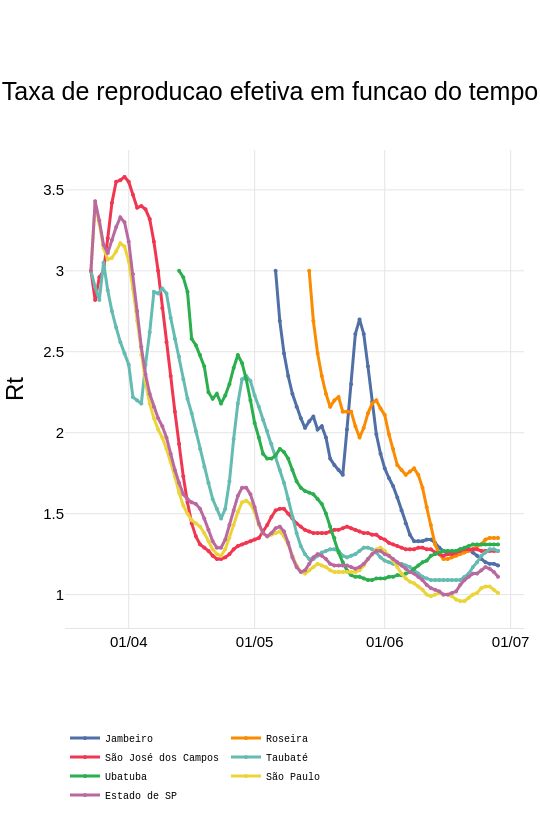

In [15]:
municipios = ['São Paulo', 'Estado de SP', 'Taubaté', 'São José dos Campos', 'Jambeiro','Roseira','Ubatuba']
vale_filtered = vale[vale['nome_municipio'].isin(municipios)]



themes = yaml.load(open('../themes/themes_simulaCovid.yaml', 'r'), Loader=yaml.FullLoader)
themes = themes['rt_selected_cities']
fig = vis_simulaCovid.plot_rt_plotly(vale_filtered, themes)

fig

## BR

In [16]:
br = pd.read_csv('../../brasil_geodata/maps/br_municipios_ibge.csv')
br = br[['geocodigo','nome_municipio','nome_uf']]

br_rt_full = df.copy()
br_rt_full = br.merge(br_rt_full, how='right', left_on = 'geocodigo', right_on = 'city_id')




br_rt = br_rt_full.sort_values(by='last_updated', ascending=False).groupby(by='city_id', as_index=False).first().sort_values(by='Rt_most_likely', ascending=True)




In [17]:
br_rt.head(3)

,city_id,geocodigo,nome_municipio,nome_uf,last_updated,Rt_most_likely,Rt_low_95,Rt_high_95,data_last_refreshed
572,2111300,2111300,São Luís,Maranhão,2020-06-28,0.60,0.52,0.66,2020-06-29 07:10:10
153,1500800,1500800,Ananindeua,Pará,2020-06-28,0.81,0.73,0.88,2020-06-29 07:10:10
162,1501402,1501402,Belém,Pará,2020-06-28,0.82,0.76,0.86,2020-06-29 07:10:10


In [18]:
municipios = br_rt.head(3)['nome_municipio'].tolist() + ['São Paulo', 'Estado de SP', 'Taubaté', 'São José dos Campos', 'Assis']

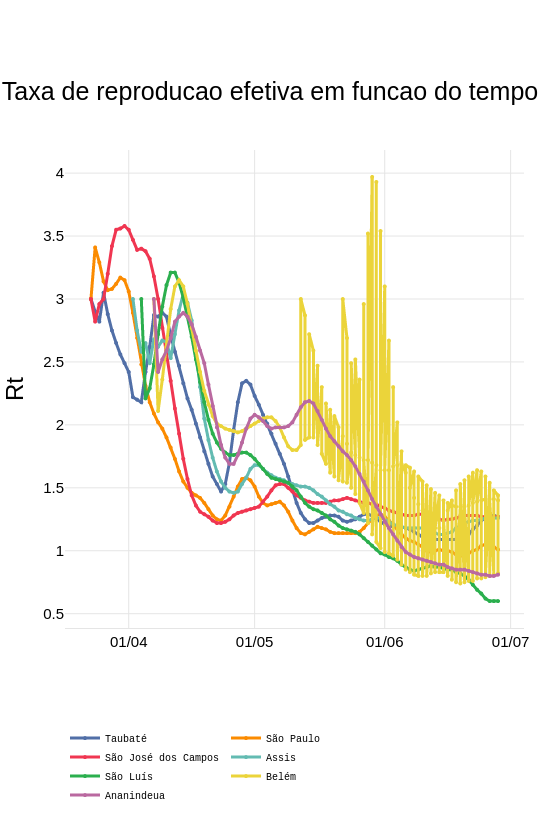

In [19]:
br_rt_filtered = br_rt_full[br_rt_full['nome_municipio'].isin(municipios)].sort_values(by='last_updated')



themes = yaml.load(open('../themes/themes_simulaCovid.yaml', 'r'), Loader=yaml.FullLoader)
themes = themes['rt_selected_cities']
fig = vis_simulaCovid.plot_rt_plotly(br_rt_filtered, themes)

fig

## RT MAP

In [ ]:
#load br cities
sp = gpd.read_file('../../brasil_geodata/maps/sp_municipios.json')
cols = ['geocodigo','nome_mesorregiao','geometry']
sp = sp[cols]

In [ ]:
#load data
url  = 'http://datasource.coronacidades.org:7000/'
data = 'br/cities/farolcovid/main'

df = pd.read_csv(f'{url}{data}')

dd = df.merge(sp, how='right', left_on = 'city_id', right_on = 'geocodigo')
dd = gpd.GeoDataFrame(dd)


regiao = 'Vale do Paraíba Paulista'
mask = dd['nome_mesorregiao']==regiao
vale = dd[mask]

vale = gpd.GeoDataFrame(vale)

In [116]:
def plot_map(dd,var):
    fig = plt.figure(figsize=(25,25))
    ax  = fig.add_subplot(1,1,1)
    ax.set_title(f'{var}', fontsize=23)


    missings={
        "color": "white",
        "edgecolor": "red",
        "hatch": "///",
        "label": "Missing values",
    }


    # dd.plot(column=var,ax=ax, legend=True,cmap='Oranges', edgecolor = "#ffffff",  scheme='user_defined', classification_kwds={'bins':[0.75,1]},missing_kwds=missings )
#     dd.plot(column=var,ax=ax, legend=True,cmap='Oranges', edgecolor = "#ffffff",  scheme='user_defined', classification_kwds={'bins':[10,100,500,1000,10000]},missing_kwds=missings )
#     dd.plot(column=var,ax=ax, legend=True,cmap='Oranges', edgecolor = "#ffffff",  scheme='user_defined', classification_kwds={'bins':[1,5,10,50,100,500,1000,3000]},missing_kwds=missings )
    dd.plot(column=var,ax=ax, legend=True,cmap='Oranges', edgecolor = "#ffffff",  scheme='user_defined', classification_kwds={'bins':[10,30,50,70]},missing_kwds=missings )

#     dd.plot(column=var ,ax=ax, legend=True,cmap='Oranges', edgecolor = "#ffffff" ,missing_kwds=missings, scheme='quantiles',k=30)

    ax.axis('off')


    plt.rc('legend',fontsize='large')

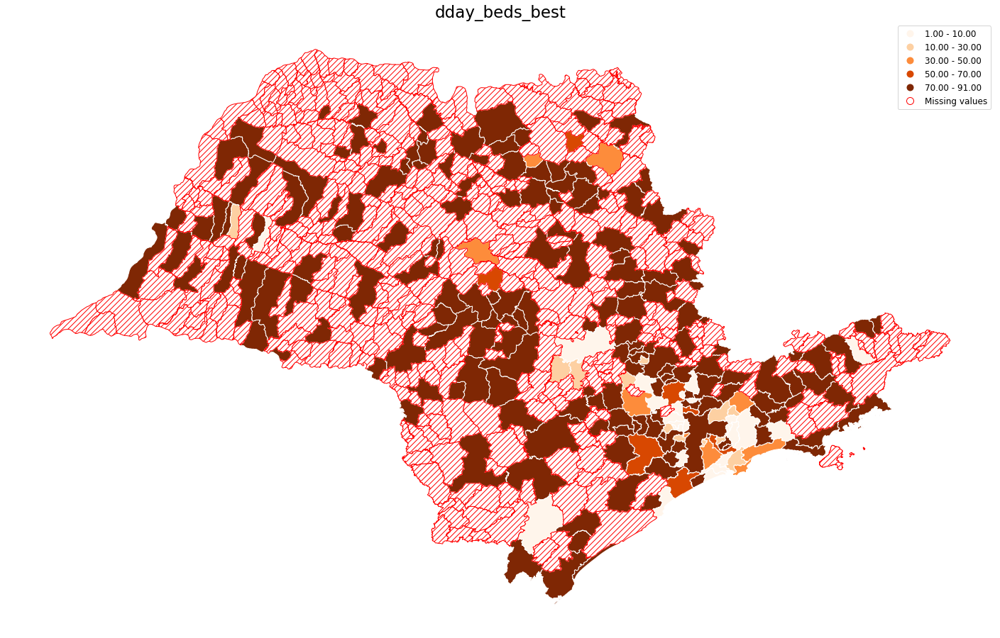

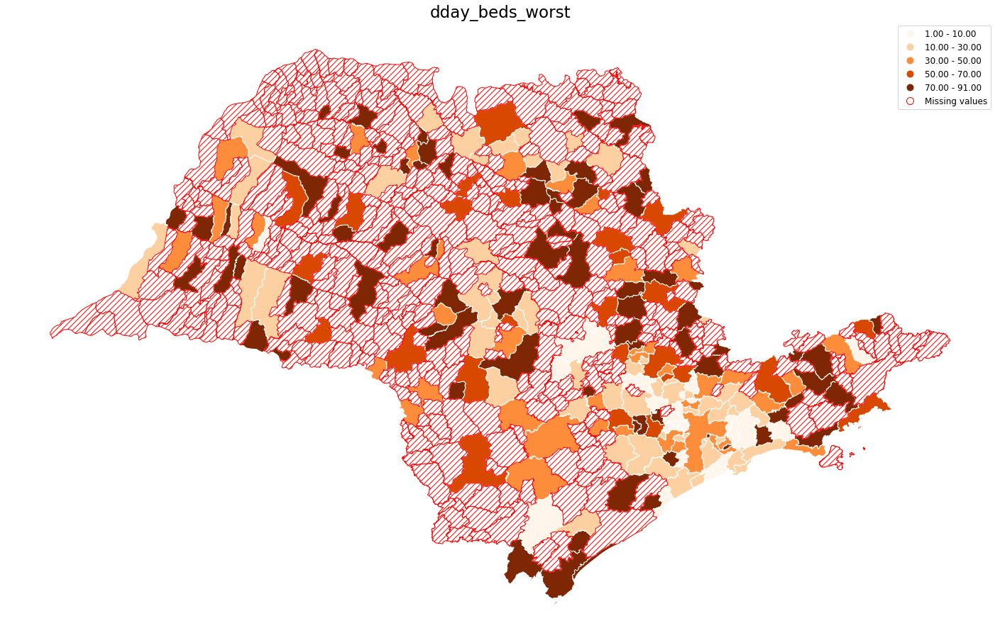

In [117]:
var = 'dday_beds_best'

plot_map(dd,var)


var = 'dday_beds_worst'

plot_map(dd,var)



# var = 'rt_10days_ago_avg'

# plot_map(dd,var)

# var = 'rt_ratio_week_avg'

# plot_map(dd,var)